In [11]:
import scanpy as sc
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from utils import preprocessing

# Preprocess Bican Data

Zoned

Spatial

In [2]:
msn_type_path_dict = {
    "eMSN_D1D2": {"path": "/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/STR_eMSN_D1D2_Matrix.qs", "zone_col": "Final_Zone_Assignments_No_Smooth", "donor_col": "donor", "x": "x_um2", "y": "y_um2"}, #gs://macosko_data/akraft/Zonal_Objects/
    "Patch_D1": {"path": "/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/STR_D1_Patch_MSN.qs", "zone_col": "Final_Zone_Assignments_No_Smooth", "donor_col": "donor", "x": "x_um2", "y": "y_um2"}, # gs://macosko_data/akraft/Zonal_Objects/
    "Patch_D2": {"path": "/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/STR_D2_Patch_MSN.qs", "zone_col": "Final_Zone_Assignments_No_Smooth", "donor_col": "donor", "x": "x_um2", "y": "y_um2"}, # gs://macosko_data/akraft/Zonal_Objects/
    "Matrix_D1": {"path": "/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/STR_D1_Matrix_MSN.qs", "zone_col": "D1_Matrix_Zone", "donor_col": "donor", "x": "x_position", "y": "y_position"},# gs://macosko_data/akraft/Human_Striatum_Slide-tags/High_Quality_by_Celltype/
    "Matrix_D2": {"path": "/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/STR_D2_Matrix_MSN.qs", "zone_col": "D2_Matrix_Zone", "donor_col": "donor", "x": "x_position", "y": "y_position"}, #gs://macosko_data/akraft/Human_Striatum_Slide-tags/High_Quality_by_Celltype/
}

In [3]:
for cell_type, infos in list(msn_type_path_dict.items())[1:3]:

    print(f"Processing {cell_type} ...")

    PATH_BASE   = "/home/gdallagl/myworkdir/XDP/data/_tmp"
    saving_path = f"/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/{cell_type}.h5ad"

    preprocessing.read_qs_save_files(infos["path"], PATH_BASE, assay="RNA")
    adata = preprocessing.build_h5ad_from_files(PATH_BASE, saving_path)

    # direct assignment avoids duplicate columns when "x"/"donor_id" already exist in metadata
    adata.obs["donor_id"] = adata.obs[infos["donor_col"]]
    adata.obs["x"]        = adata.obs[infos["x"]]
    adata.obs["y"]        = adata.obs[infos["y"]]
    adata.obs["zone"]     = adata.obs[infos["zone_col"]].astype("Int64").astype("category")

    adata = adata[
        adata.obs["x"].notna() &
        adata.obs["y"].notna() &
        adata.obs["zone"].notna() &
        adata.obs["donor_id"].notna()
        ].copy()

    adata.obsm["spatial"] = np.array([adata.obs["x"], adata.obs["y"]]).T
    adata.obs["ct_for_deg"] = cell_type

    print(adata)
    print(adata.obs["donor_id"].value_counts())

    adata.write_h5ad(saving_path)

    #break


Processing Patch_D1 ...


R callback write-console: Loading required package: SeuratObject
  
R callback write-console: Loading required package: sp
  
R callback write-console: 
Attaching package: ‘SeuratObject’

  
R callback write-console: The following objects are masked from ‘package:base’:

    %||%, intersect, t

  



    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    

R callback write-console: 
Attaching package: ‘Seurat’

  
R callback write-console: The following object is masked from ‘package:base’:

    %||%

  
R callback write-console: qs 0.27.3. Announcement: https://github.com/qsbase/qs/issues/103
  


Seurat version: 5.4.0 
Detected Seurat v5 assay


/home/gdallagl/myworkdir/XDP/utils/preprocessing.py:148: DtypeWarning: Columns (94,96,97,98,109,111,118,120,121,122,133,135) have mixed types. Specify dtype option on import or set low_memory=False.
  metadata = pd.read_csv(f"{PATH_BASE}/metadata.csv", index_col=0)


AnnData object with n_obs × n_vars = 9361 × 37905
    obs: 'orig.ident', 'nCount_originalexp', 'nFeature_originalexp', 'PREFIX', 'CELL_BARCODE', 'NUM_GENIC_READS', 'NUM_TRANSCRIPTS', 'NUM_GENES', 'num_retained_transcripts', 'pct_coding', 'pct_utr', 'pct_intergenic', 'pct_genic', 'pct_intronic', 'pct_mt', 'pct_ribosomal', 'frac_contamination', 'experiment', 'donor_external_id', 'is_primary_data', 'Neighborhood_label', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Class_label', 'Class_name', 'Class_bootstrapping_probability', 'Subclass_label', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Group_label', 'Group_name', 'Group_bootstrapping_probability', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'donor_id', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'x', 'y', 'RNA_snn_res.0.8', 'seurat_clusters', 'library', 'donor', 'x_um2', 'y_um2', 'unique_cell_ID', 'AK_celltype', 'RNA_snn_res.0.2', 'cb', 'clusters', 'num_dbscan', 'log

/home/gdallagl/myworkdir/XDP/utils/preprocessing.py:148: DtypeWarning: Columns (94,96,97,98,109,111,118,120,121,122,133,135) have mixed types. Specify dtype option on import or set low_memory=False.
  metadata = pd.read_csv(f"{PATH_BASE}/metadata.csv", index_col=0)


AnnData object with n_obs × n_vars = 7827 × 37905
    obs: 'orig.ident', 'nCount_originalexp', 'nFeature_originalexp', 'PREFIX', 'CELL_BARCODE', 'NUM_GENIC_READS', 'NUM_TRANSCRIPTS', 'NUM_GENES', 'num_retained_transcripts', 'pct_coding', 'pct_utr', 'pct_intergenic', 'pct_genic', 'pct_intronic', 'pct_mt', 'pct_ribosomal', 'frac_contamination', 'experiment', 'donor_external_id', 'is_primary_data', 'Neighborhood_label', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Class_label', 'Class_name', 'Class_bootstrapping_probability', 'Subclass_label', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Group_label', 'Group_name', 'Group_bootstrapping_probability', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'donor_id', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'x', 'y', 'RNA_snn_res.0.8', 'seurat_clusters', 'library', 'donor', 'x_um2', 'y_um2', 'unique_cell_ID', 'AK_celltype', 'RNA_snn_res.0.2', 'cb', 'clusters', 'num_dbscan', 'log

# *) How to draw splines

1. make csv files with cell barcodes as index and x,y columns
2. move to R, follow the instructions here to draw spline and save results https://docs.google.com/document/d/181SnwQdWJkku2wrG-MGyENsZnDij3jbw9V1BOhs_IY4/edit?tab=t.0


# Create a merged obj with D1D2, Matrix and Striosome

In [ ]:
d1d2 = sc.read_h5ad('/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/eMSN_D1D2.h5ad')

d1d2_samples = d1d2.obs["donor_id"].unique().tolist()

processed = []
for cell_type, infos in list(msn_type_path_dict.items())[:]:

    print(cell_type)

    if cell_type == "eMSN_D1D2":
        processed.append(d1d2)
    else:
        adata = sc.read_h5ad(f'/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/{cell_type}.h5ad', backed='r')
        print(adata)
        print(adata.obs["donor_id"].value_counts())
        adata = adata[adata.obs["donor_id"].isin(d1d2_samples), :].to_memory().copy()  # keep only donors that are in eMSN_D1D2

    processed.append(adata)

# concat
adata = sc.concat(processed)
adata.obs_names_make_unique()
adata.obs["ct"] = adata.obs["ct_for_deg"].map({
    "eMSN_D1D2": "eMSN_D1D2", "Matrix_D1": "Matrix", "Matrix_D2": "Matrix",
    "Patch_D1": "Patch", "Patch_D2": "Patch"
})

adata.layers["counts"] = adata.X.copy()  # store raw counts in a separate layer


eMSN_D1D2
Patch_D1
AnnData object with n_obs × n_vars = 9361 × 37905 backed at '/home/gdallagl/myworkdir/XDP/data/BICAN/bican_spatial_zonated/Patch_D1.h5ad'
    obs: 'orig.ident', 'nCount_originalexp', 'nFeature_originalexp', 'PREFIX', 'CELL_BARCODE', 'NUM_GENIC_READS', 'NUM_TRANSCRIPTS', 'NUM_GENES', 'num_retained_transcripts', 'pct_coding', 'pct_utr', 'pct_intergenic', 'pct_genic', 'pct_intronic', 'pct_mt', 'pct_ribosomal', 'frac_contamination', 'experiment', 'donor_external_id', 'is_primary_data', 'Neighborhood_label', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Class_label', 'Class_name', 'Class_bootstrapping_probability', 'Subclass_label', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Group_label', 'Group_name', 'Group_bootstrapping_probability', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'donor_id', 'n_counts', 'nCount_RNA', 'nFeature_RNA', 'x', 'y', 'RNA_snn_res.0.8', 'seurat_clusters', 'library', 'donor',

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1796: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/tmp/ipykernel_2287797/4262984332.py:22: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`. Example key collisions generated by the make_index_unique algorithm: ['s5_s5_CCAGACCCACTATAGC_1-1', 's5_s5_CATCTTGGTGCGGGTT_1-1', 's5_s5_AGGTTAGCAATCCCGA_1-1', 's5_s5_GGAATGGTCGTACAAT_1-1', 's5_s5_GCGAATACAGGTTGCC_1-1']
  adata.obs_names_make_unique()


/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


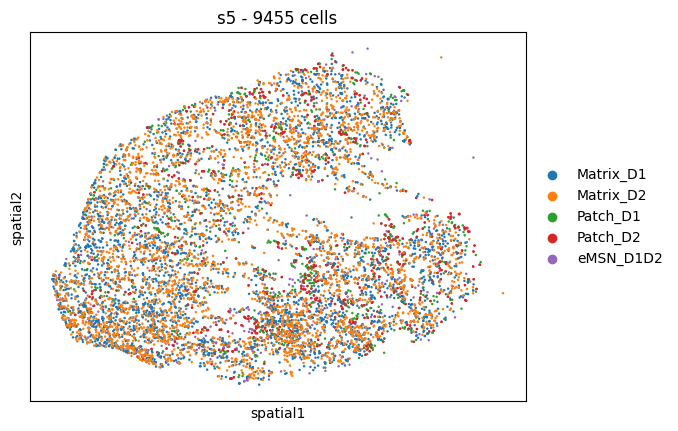

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


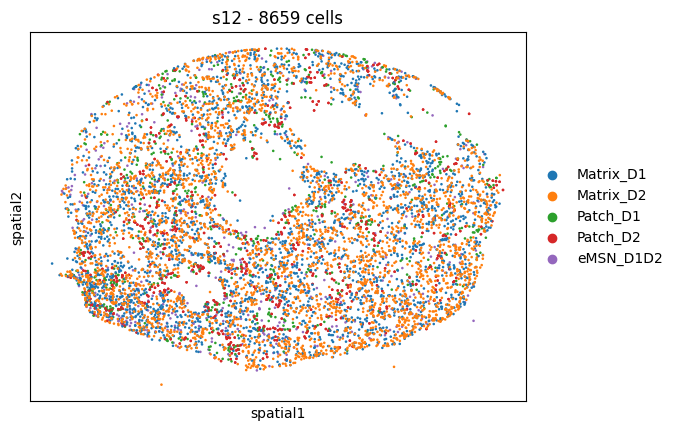

In [15]:
for s in adata.obs["donor_id"].unique()[:2]:
    sc.pl.embedding(adata[adata.obs["donor_id"] == s], basis="spatial", color=["ct_for_deg"], title=f"{s} - {adata[adata.obs['donor_id'] == s].shape[0]} cells")
    #break

# Write Files with coordinates

In [6]:
path = '/home/gdallagl/myworkdir/XDP/data/BICAN/for_splines'
os.makedirs(path, exist_ok=True)

for s in adata.obs["donor_id"].unique():

    obs = adata[adata.obs["donor_id"] == s].obs[["x", "y"]].copy()
    #obs = obs[["x", "y"]].dropna().copy() # dine it before

    #display(obs)

    obs.to_csv(os.path.join(path, f"{s}_x_y.csv"), index=True)
    #break


# Move things to R and draw spline 

One Sample at a time

Here we reprot matrix zones to facility the drawing of splines

- df <- read.csv("yourfile.csv", row.names = 1)  # must have x, y columns
- spl <- anno_spline(df)
- result <- xy2dr(df, spl)
- write.csv(result, "df.csv")

```R
process_sample <- function(s) {
  base <- sprintf("~/Downloads/samples_xdp/s%s_x_y", s)
  df     <- read.csv(paste0(base, ".csv"), row.names = 1)
  spl    <- anno_spline(df)
  result <- xy2dr(df, spl)
  write.csv(result, paste0(base, "_with_splines.csv"))
  invisible(result)
}
```

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


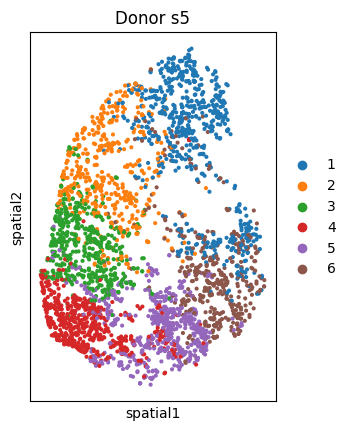

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


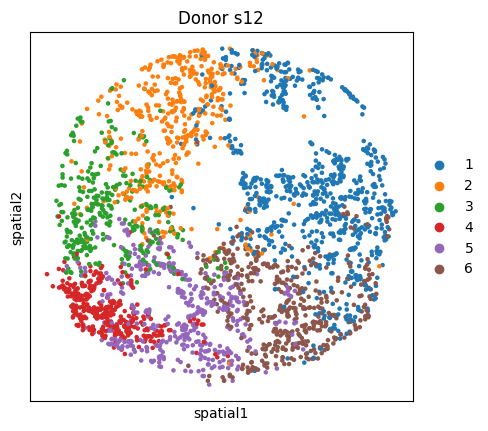

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


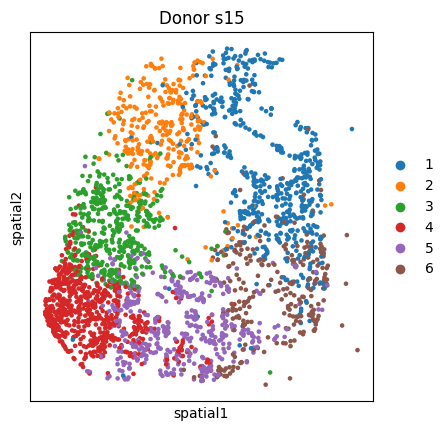

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


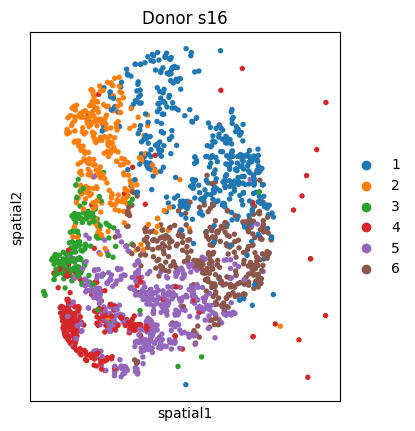

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


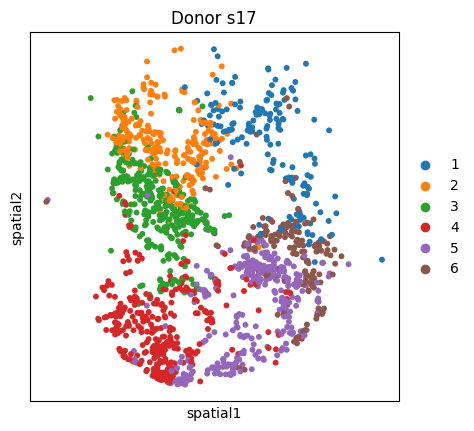

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


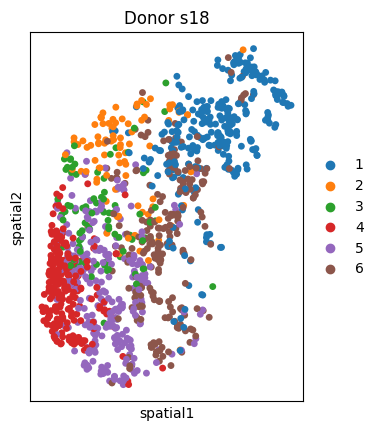

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


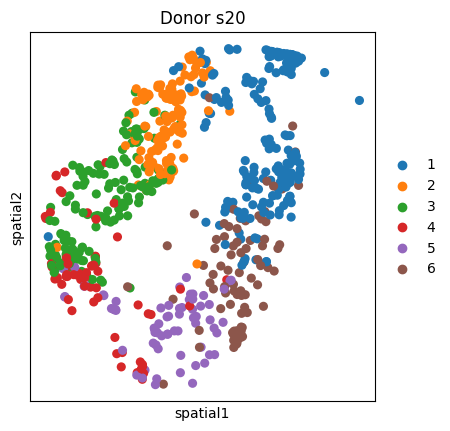

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


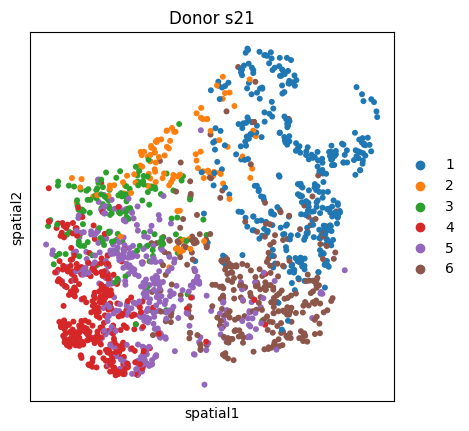

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


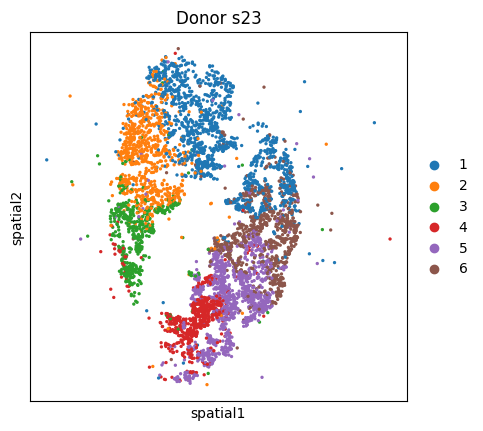

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


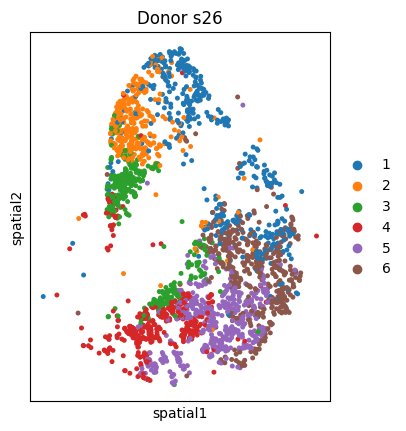

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


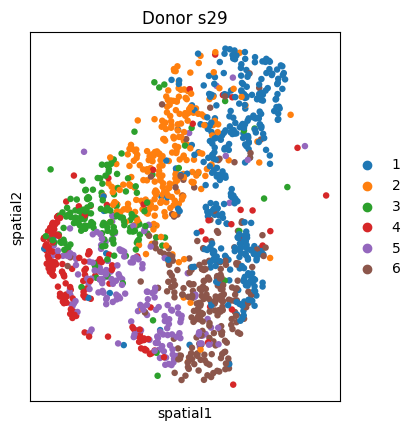

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


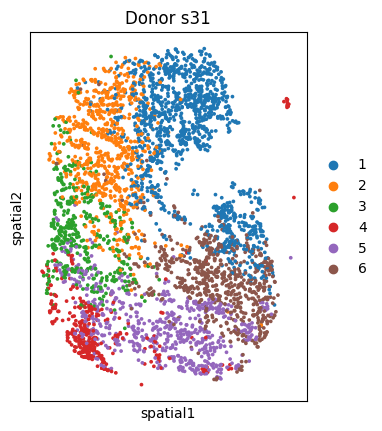

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


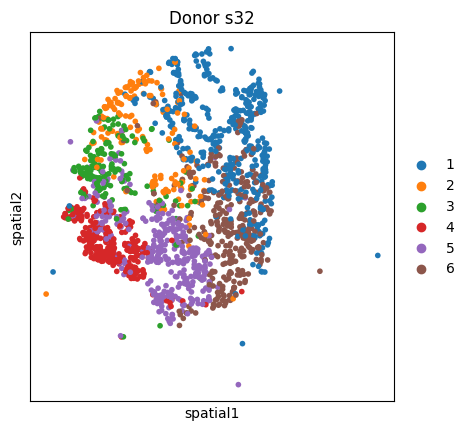

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


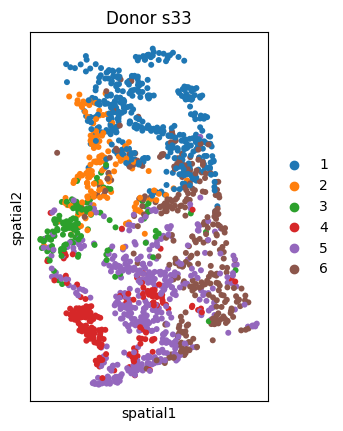

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


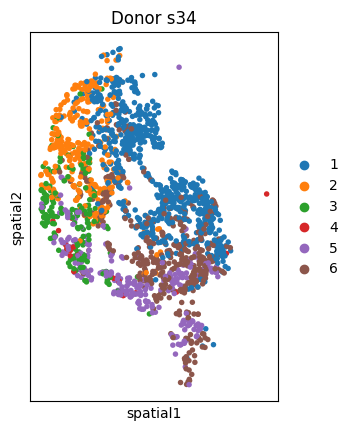

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


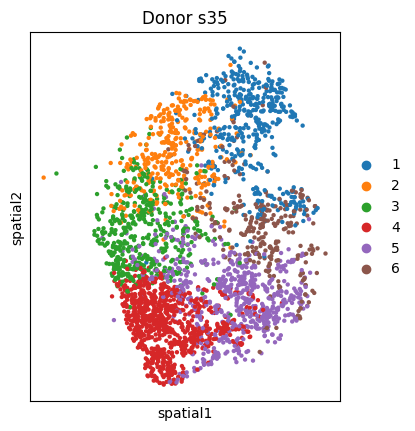

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


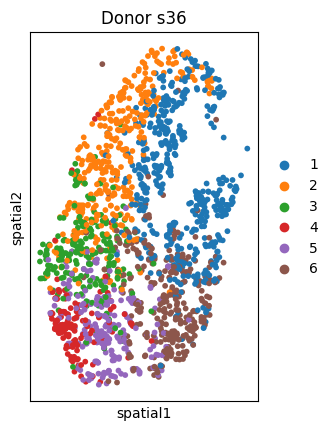

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


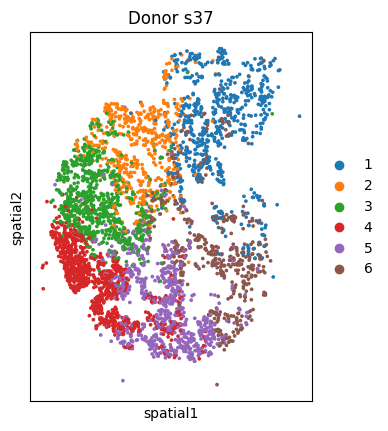

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


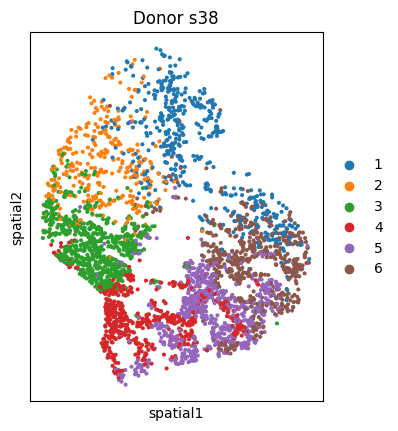

In [18]:
for s in adata.obs["donor_id"].unique()[:]:
    axs = sc.pl.embedding(
        adata[(adata.obs["donor_id"] == s) & (adata.obs["ct_for_deg"] == "Matrix_D1")],
        basis="spatial",
        color=["zone"],
        title=f"Donor {s}",
        show=False,
    )

    # color=[...] returns a list; a bare string returns a single Axes — handle both
    for ax in (axs if isinstance(axs, list) else [axs]):
        ax.set_aspect("equal")

    plt.show()    #break

    

# Read splines data and add info

In [28]:
# initialize once BEFORE the loop so the columns exist
adata.obs["r"] = np.nan
adata.obs["d"] = np.nan

for s in adata.obs["donor_id"].unique():
    csv_path = f"/home/gdallagl/myworkdir/XDP/data/BICAN/for_splines/{s}_x_y_with_splines.csv"
    if not os.path.exists(csv_path):
        print(f"Donor {s} - spline file not found, skipping ...")
        continue

    df_spline = pd.read_csv(csv_path, index_col=0)

    # Normalise
    df_spline["r_original"] = df_spline["r"].copy()  # keep original for reference
    df_spline["r"] = df_spline["r"] / df_spline["r"].max()

    # assign by row (cell barcode), into named columns — pandas aligns on index
    adata.obs.loc[df_spline.index, "r"] = df_spline["r"]
    adata.obs.loc[df_spline.index, "d"] = df_spline["d"]

adata.obs["region"] = np.where(adata.obs["d"] < 0, "caudate", "putamen")


Donor s34 - spline file not found, skipping ...


/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of

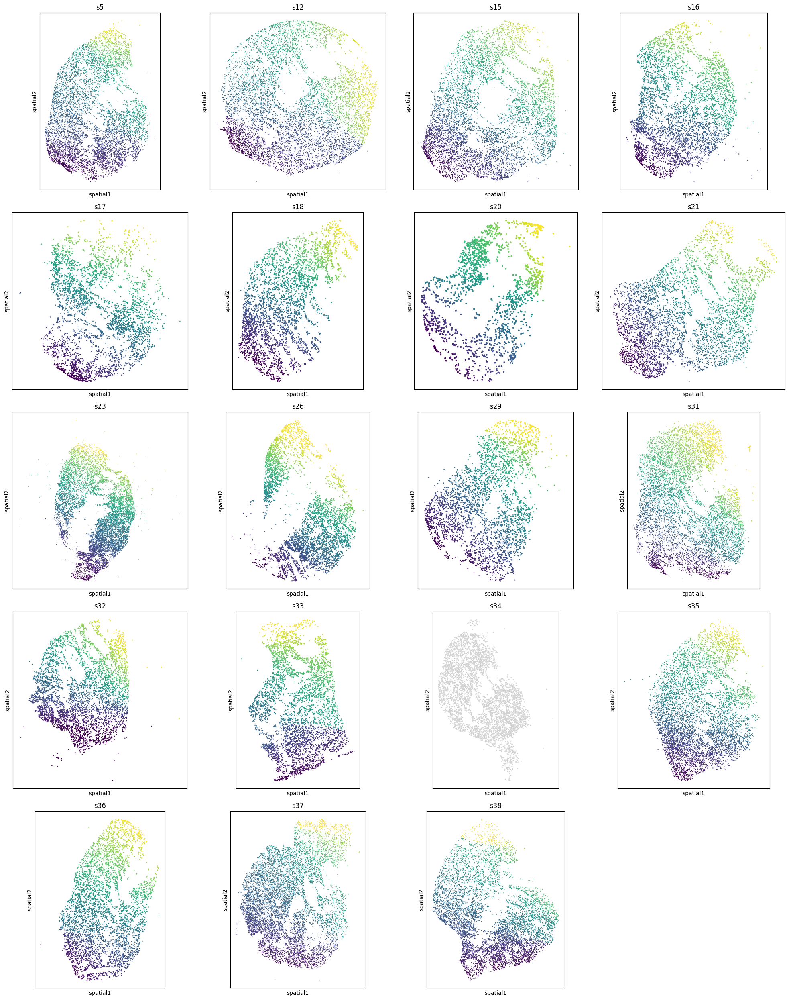

In [54]:
donors = adata.obs["donor_id"].unique()
ncols  = 4
nrows  = int(np.ceil(len(donors) / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 5 * nrows))
axes = axes.flatten()

for ax, s in zip(axes, donors):
    sc.pl.embedding(
        adata[adata.obs["donor_id"] == s],
        basis="spatial",
        color="r",
        title=f"{s}",
        ax=ax,
        show=False,
        colorbar_loc=None,
    )
    ax.set_aspect("equal")

# hide unused axes
for ax in axes[len(donors):]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()


/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of

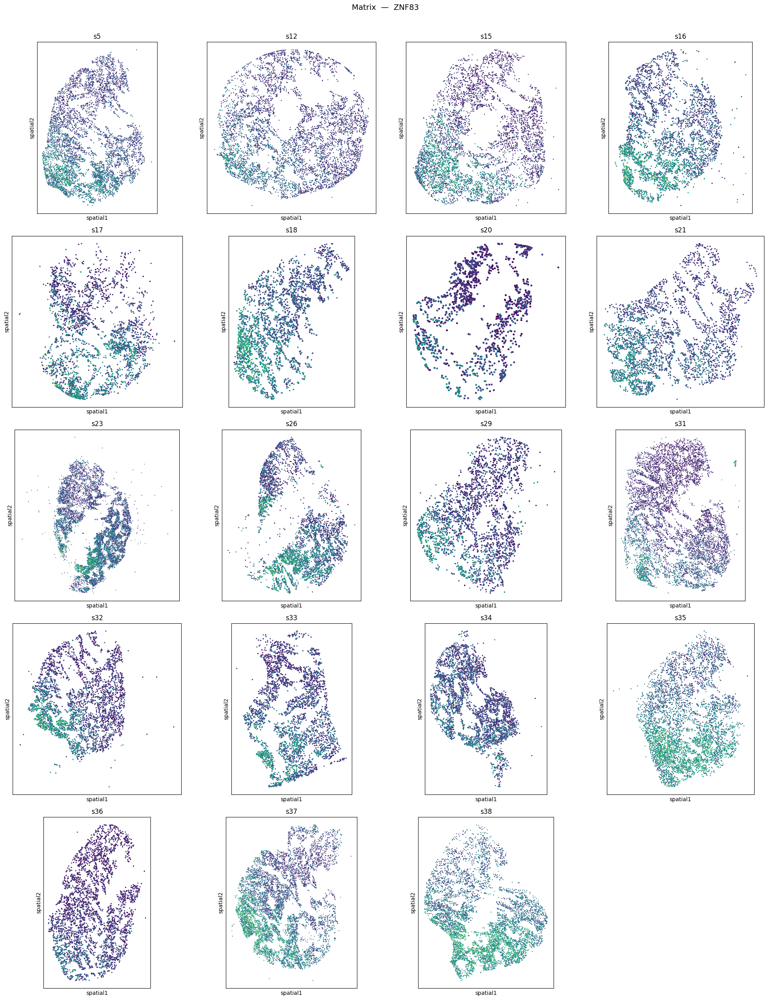

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of

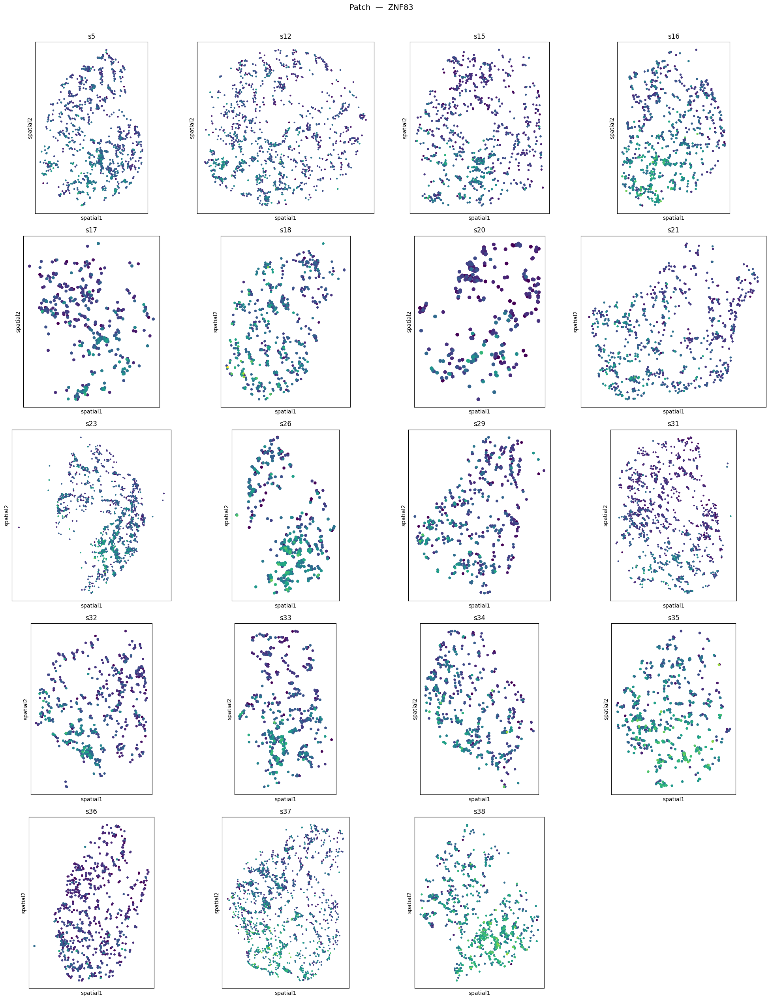

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of

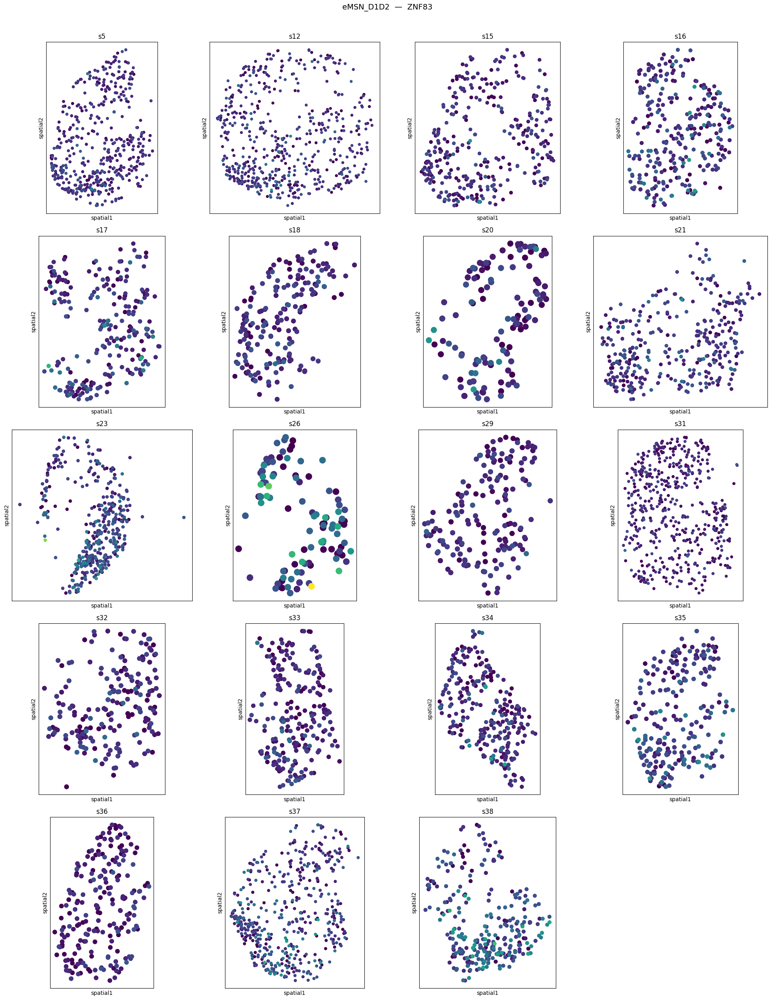

In [78]:
GENE = "ZNF83"# "GLI3" #← change this

donors  = adata.obs["donor_id"].unique()
ncols   = 4

for ct in ["Matrix", "Patch", "eMSN_D1D2"]:

    adata_ct = adata[adata.obs["ct"] == ct].copy()
    adata_ct.X = adata_ct.layers["log1p_norm"]   # set layer for plotting

    donors_ct = adata_ct.obs["donor_id"].unique()
    nrows     = int(np.ceil(len(donors_ct) / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 5 * nrows))
    axes = axes.flatten()

    # shared color scale across donors for this cell type
    vmax = adata_ct[:, GENE].X.toarray().max() if sparse.issparse(adata_ct.X) else adata_ct[:, GENE].X.max()

    for ax, s in zip(axes, donors_ct):
        sc.pl.embedding(
            adata_ct[adata_ct.obs["donor_id"] == s],
            basis="spatial",
            color=GENE,
            layer="log1p_norm",
            title=f"{s}",
            ax=ax,
            show=False,
            colorbar_loc=None,
            vmin=0,
            vmax=vmax,
        )
        ax.set_aspect("equal")

    for ax in axes[len(donors_ct):]:
        ax.set_visible(False)

    fig.suptitle(f"{ct}  —  {GENE}", fontsize=14, y=1.01)
    plt.tight_layout()
    plt.show()


# Calculate correlation of each gene wiht spline for each cell type

In [ ]:
# check if data is raw counts
adata.X = adata.layers["counts"].copy()  # restore raw counts before normalization
print(adata.X[:100, :100].toarray().sum(axis=1))

# normalise
print("Filtering genes and normalizing the data...")
sc.pp.filter_genes(adata, min_cells=1) 
print("Normaliszing...")
sc.pp.normalize_total(adata, target_sum=1e4) #necessary !!!
print("Log1p transformation...")
sc.pp.log1p(adata) # not os mauch as corr is trank based

adata.layers["log1p_norm"] = adata.X.copy()
adata

[ 52 264  84 158 187  50 265 230  94 187 221 188  31 127 187 129 191 163
  31 245 225  30 226 338 100 197 190 171 178 176 102 233 360 133 222 211
 135 299 286 215 222 102 270  52 160 163 191 287 211 227 229  56  96 212
 194 109 265 221 351 101 163 236 278 116 238 346  85 209 165  68  24 316
  42 147 157 209 267 239 153 147  85 124 139 163 223  86 181 226 172 344
  68 178  65 307 231 202  83 162 261 152]


AnnData object with n_obs × n_vars = 245247 × 37055
    obs: 'pct_coding', 'pct_utr', 'pct_intergenic', 'pct_genic', 'pct_intronic', 'pct_mt', 'pct_ribosomal', 'frac_contamination', 'experiment', 'Neighborhood_label', 'Neighborhood_name', 'Class_label', 'Class_name', 'Subclass_label', 'Subclass_name', 'Group_label', 'Group_name', 'donor_id', 'nCount_RNA', 'nFeature_RNA', 'x', 'y', 'library', 'unique_cell_ID', 'zone', 'ct_for_deg', 'ct', 'r', 'd', 'region'
    var: 'n_cells'
    uns: 'log1p'
    obsm: 'spatial'
    layers: 'counts', 'log1p_norm'

In [31]:
adata[adata.obs["ct"] == "eMSN_D1D2"]

View of AnnData object with n_obs × n_vars = 0 × 37055
    obs: 'pct_coding', 'pct_utr', 'pct_intergenic', 'pct_genic', 'pct_intronic', 'pct_mt', 'pct_ribosomal', 'frac_contamination', 'experiment', 'Neighborhood_label', 'Neighborhood_name', 'Class_label', 'Class_name', 'Subclass_label', 'Subclass_name', 'Group_label', 'Group_name', 'donor_id', 'nCount_RNA', 'nFeature_RNA', 'x', 'y', 'library', 'unique_cell_ID', 'zone', 'ct_for_deg', 'ct', 'r', 'd', 'region'
    var: 'n_cells'
    uns: 'log1p'
    obsm: 'spatial'
    layers: 'counts', 'log1p_norm'

In [ ]:
import numpy as np
from scipy.stats import rankdata, ttest_1samp
from scipy import sparse
from statsmodels.stats.multitest import multipletests
import pandas as pd

def calc_spatial_corr_multi_donor(adata, metric_key="r", donor_col="donor_id", min_cells=20):

    X_full = adata.layers["log1p_norm"]
    X_full = X_full.toarray() if sparse.issparse(X_full) else np.asarray(X_full, dtype=float)

    donor_rhos  = {}   # donor -> array (n_genes,)
    donor_ncells = {}  # donor -> int

    for donor in adata.obs[donor_col].unique():

        mask = (adata.obs[donor_col] == donor).values
        r    = adata.obs.loc[mask, metric_key].values.astype(float)
        valid = ~np.isnan(r)

        if valid.sum() < min_cells:
            print(f"  Skipping {donor}: only {valid.sum()} valid cells")
            continue

        X = X_full[mask][valid]
        r = r[valid]

        Xr = rankdata(X, axis=0).astype(float)
        yr = rankdata(r).astype(float)
        Xr -= Xr.mean(axis=0)
        yr -= yr.mean()

        denom = np.sqrt((Xr**2).sum(axis=0) * (yr**2).sum())
        with np.errstate(divide="ignore", invalid="ignore"):
            rho = (Xr.T @ yr) / denom

        rho = np.where(denom == 0, 0.0, rho)   # constant gene → rho = 0, no warning

        donor_rhos[donor]   = rho
        donor_ncells[donor] = valid.sum()

    if len(donor_rhos) < 2:
        raise ValueError("Need at least 2 donors with data")

    genes      = adata.var_names
    donor_list = list(donor_rhos.keys())

    # --- donors x genes raw correlation matrix ---
    rho_matrix = np.array([donor_rhos[d] for d in donor_list])          # (n_donors, n_genes)
    df_raw     = pd.DataFrame(rho_matrix, index=donor_list, columns=genes)

    # --- Fisher z aggregation ---
    z_matrix     = np.arctanh(np.clip(rho_matrix, -0.9999, 0.9999))
    z_mean       = z_matrix.mean(axis=0)
    rho_combined = np.tanh(z_mean)

    tstat, pval = ttest_1samp(z_matrix, popmean=0, axis=0)

    df_summary = pd.DataFrame({
        "rho"     : rho_combined,
        "pval"    : pval,
        "n_donors": len(donor_rhos),
    }, index=genes)
    df_summary["padj"] = multipletests(df_summary["pval"].fillna(1), method="fdr_bh")[1]
    df_summary = df_summary.sort_values("rho", key=np.abs, ascending=False)

    return df_summary, df_raw


df_corr_r_d1d2, df_raw_d1d2 = calc_spatial_corr_multi_donor(adata[adata.obs["ct"] == "eMSN_D1D2"], metric_key="r")
df_corr_r_matrix, df_raw_matrix = calc_spatial_corr_multi_donor(adata[adata.obs["ct"] == "Matrix"], metric_key="r")
df_corr_r_patch, df_raw_patch = calc_spatial_corr_multi_donor(adata[adata.obs["ct"] == "Patch"], metric_key="r")

df_corr = pd.DataFrame({
    "rho_Matrix":  df_corr_r_matrix["rho"],
    "padj_Matrix": df_corr_r_matrix["padj"],
    "rho_Patch":   df_corr_r_patch["rho"],
    "padj_Patch":  df_corr_r_patch["padj"],
    "rho_eMSN":    df_corr_r_d1d2["rho"],
    "padj_eMSN":   df_corr_r_d1d2["padj"],
})

# save dfs
df_corr_r_d1d2.to_csv("/home/gdallagl/myworkdir/XDP/data/BICAN/genes_correlation/df_corr_r_d1d2.csv")
df_raw_d1d2.to_csv("/home/gdallagl/myworkdir/XDP/data/BICAN/genes_correlation/df_raw_d1d2.csv")
df_corr_r_matrix.to_csv("/home/gdallagl/myworkdir/XDP/data/BICAN/genes_correlation/df_corr_r_matrix.csv")
df_raw_matrix.to_csv("/home/gdallagl/myworkdir/XDP/data/BICAN/genes_correlation/df_raw_matrix.csv")
df_corr_r_patch.to_csv("/home/gdallagl/myworkdir/XDP/data/BICAN/genes_correlation/df_corr_r_patch.csv")
df_raw_patch.to_csv("/home/gdallagl/myworkdir/XDP/data/BICAN/genes_correlation/df_raw_patch.csv")
df_corr.to_csv("/home/gdallagl/myworkdir/XDP/data/BICAN/genes_correlation/df_corr.csv")

  Skipping s34: only 0 valid cells
  Skipping s34: only 0 valid cells
  Skipping s34: only 0 valid cells


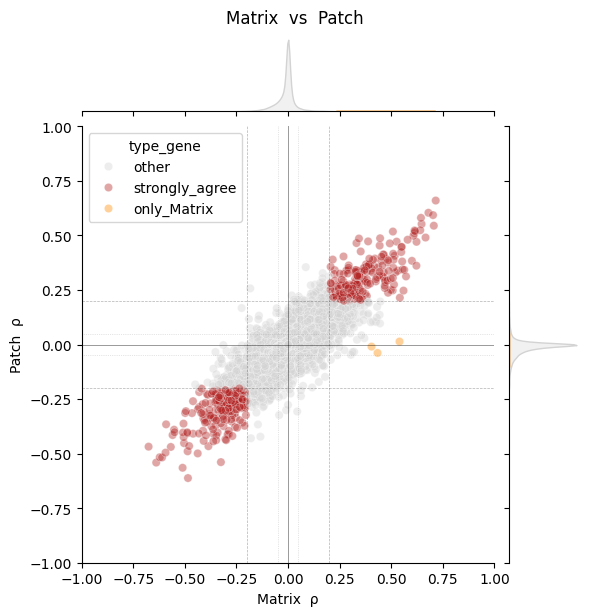

type_gene
other             36592
strongly_agree      460
only_Matrix           3
Name: Matrix vs Patch, dtype: int64

strongly_disagree


,rho_Matrix,rho_Patch,padj_Matrix,padj_Patch,type_gene


only_Matrix


,rho_Matrix,rho_Patch,padj_Matrix,padj_Patch,type_gene
GLI3,0.540033,0.013832,1.910977e-12,0.446831,only_Matrix
CPNE8,0.433549,-0.038400,4.405245e-09,0.064326,only_Matrix
LINC02822,0.404345,-0.009421,4.966257e-08,0.567834,only_Matrix


only_Patch


,rho_Matrix,rho_Patch,padj_Matrix,padj_Patch,type_gene


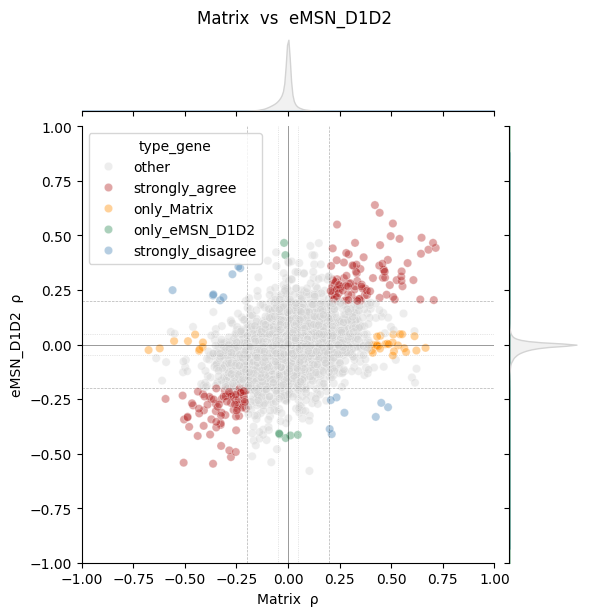

type_gene
other                36815
strongly_agree         182
only_Matrix             35
strongly_disagree       16
only_eMSN_D1D2           7
Name: Matrix vs eMSN_D1D2, dtype: int64

strongly_disagree


,rho_Matrix,rho_eMSN_D1D2,padj_Matrix,padj_eMSN_D1D2,type_gene
CDH12,-0.559469,0.249476,6.195953e-11,3.694570e-06,strongly_disagree
DPP10,0.484506,-0.287183,4.430169e-10,6.944180e-06,strongly_disagree
GRM3,0.451603,-0.267150,1.003064e-09,9.891489e-06,strongly_disagree
CHRM3,0.425031,-0.331573,4.943569e-10,3.430082e-07,strongly_disagree
SLC8A1,-0.363703,0.225188,4.077177e-09,3.956517e-05,strongly_disagree
UTRN,-0.361886,0.229998,8.102160e-10,1.586612e-04,strongly_disagree
MTUS1,-0.329025,0.202758,5.974384e-10,1.576767e-05,strongly_disagree
SEMA3E,-0.313494,0.216864,9.210948e-07,5.435673e-05,strongly_disagree
DMD,0.273151,-0.312610,6.144407e-07,1.310399e-06,strongly_disagree
STAC,-0.269570,0.322299,9.519452e-06,2.955255e-07,strongly_disagree


only_Matrix


,rho_Matrix,rho_eMSN_D1D2,padj_Matrix,padj_eMSN_D1D2,type_gene
PRKG1,-0.675724,-0.025147,1.910977e-12,0.590351,only_Matrix
TESPA1,0.666159,-0.015014,3.235924e-12,0.868253,only_Matrix
SLC24A2,0.621804,-0.027164,3.022298e-09,0.609464,only_Matrix
GDA,-0.621690,-0.017558,4.365864e-12,0.605687,only_Matrix
ENSG00000287923,0.612805,0.038271,5.624463e-12,0.276262,only_Matrix
SPOCK1,0.571618,-0.033898,7.054007e-11,0.380436,only_Matrix
ENSG00000286685,0.563011,-0.016612,4.301859e-10,0.730468,only_Matrix
SAMD5,0.552903,0.047240,1.746241e-11,0.175283,only_Matrix
ERC2,-0.552158,0.016211,4.365864e-12,0.654396,only_Matrix
KCND2,0.541629,0.047611,7.639458e-11,0.389482,only_Matrix


only_eMSN_D1D2


,rho_Matrix,rho_eMSN_D1D2,padj_Matrix,padj_eMSN_D1D2,type_gene
GRIK1,-0.019253,0.466006,0.164153,8.720329e-09,only_eMSN_D1D2
DIRC3-AS1,-0.011607,-0.428453,0.675177,3.457815e-09,only_eMSN_D1D2
CADPS,0.011392,-0.416569,0.824632,3.562680e-08,only_eMSN_D1D2
SOX2-OT,0.047072,-0.413943,0.024401,8.720329e-09,only_eMSN_D1D2
NDST4,-0.041252,-0.411229,0.020340,3.411469e-09,only_eMSN_D1D2
CALCRL,-0.012893,0.410119,0.580156,1.166354e-06,only_eMSN_D1D2
PDE3A,-0.043223,-0.407302,0.169688,3.135381e-08,only_eMSN_D1D2


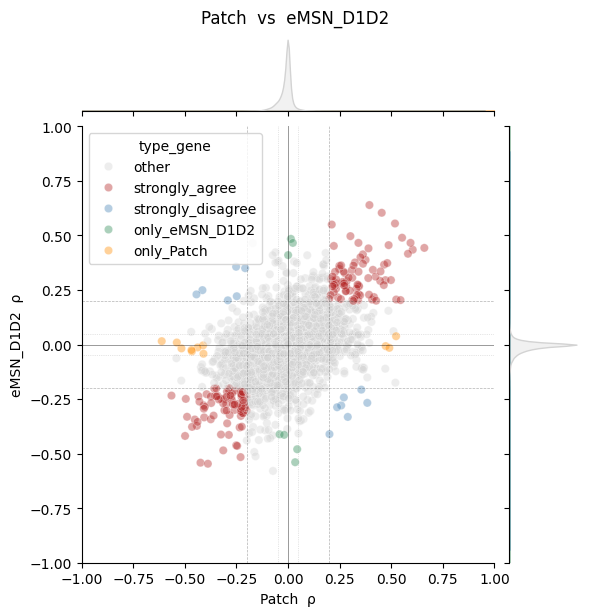

type_gene
other                36863
strongly_agree         161
strongly_disagree       13
only_Patch              11
only_eMSN_D1D2           7
Name: Patch vs eMSN_D1D2, dtype: int64

strongly_disagree


,rho_Patch,rho_eMSN_D1D2,padj_Patch,padj_eMSN_D1D2,type_gene
UTRN,-0.443767,0.229998,9.105940e-09,1.586612e-04,strongly_disagree
CDH12,-0.414844,0.249476,2.023514e-10,3.694570e-06,strongly_disagree
GRM3,0.383893,-0.267150,4.751816e-09,9.891489e-06,strongly_disagree
RGS12,0.354868,-0.206655,5.802509e-07,2.383190e-06,strongly_disagree
MTUS1,-0.291677,0.202758,6.222031e-09,1.576767e-05,strongly_disagree
CHRM3,0.289442,-0.331573,2.506506e-09,3.430082e-07,strongly_disagree
DCBLD2,0.270333,-0.242285,1.832503e-09,8.857565e-07,strongly_disagree
BACH2,0.257546,-0.279138,3.018947e-05,3.108494e-07,strongly_disagree
SGCZ,-0.251628,0.356785,1.177819e-06,8.903278e-06,strongly_disagree
MAGI2,-0.248395,0.221537,5.989106e-08,1.815265e-07,strongly_disagree


only_Patch


,rho_Patch,rho_eMSN_D1D2,padj_Patch,padj_eMSN_D1D2,type_gene
RGS6,-0.611988,0.015617,2.023514e-10,0.570542,only_Patch
SEMA3A,-0.538938,0.009361,8.195252e-10,0.945185,only_Patch
ENSG00000287923,0.523230,0.038271,2.023514e-10,0.276262,only_Patch
GDA,-0.516531,-0.017558,3.191956e-10,0.605687,only_Patch
TESPA1,0.490614,-0.015014,1.138196e-09,0.868253,only_Patch
DPP6,0.472968,-0.007023,5.668445e-11,0.987606,only_Patch
PRKG1,-0.467982,-0.025147,2.023514e-10,0.590351,only_Patch
MYRIP,-0.465906,-0.031309,3.390171e-10,0.528967,only_Patch
LRMDA,-0.438106,-0.013144,5.047544e-10,0.541355,only_Patch
ENSG00000228566,-0.411698,-0.003718,2.201425e-09,1.000000,only_Patch


only_eMSN_D1D2


,rho_Patch,rho_eMSN_D1D2,padj_Patch,padj_eMSN_D1D2,type_gene
TENM3,0.034433,-0.539277,0.232212,7.501922e-10,only_eMSN_D1D2
GLI3,0.013832,0.484551,0.446831,2.010570e-07,only_eMSN_D1D2
SPATS2L,0.044232,-0.479768,0.282437,6.082119e-10,only_eMSN_D1D2
GRIK1,0.023218,0.466006,0.225139,8.720329e-09,only_eMSN_D1D2
SOX2-OT,-0.019008,-0.413943,0.414909,8.720329e-09,only_eMSN_D1D2
NDST4,-0.041158,-0.411229,0.030850,3.411469e-09,only_eMSN_D1D2
CALCRL,0.000345,0.410119,1.000000,1.166354e-06,only_eMSN_D1D2


In [95]:
from itertools import combinations

df_rho  = pd.DataFrame({"Matrix": df_corr_r_matrix["rho"],  "Patch": df_corr_r_patch["rho"],  "eMSN_D1D2": df_corr_r_d1d2["rho"]})
df_padj = pd.DataFrame({"Matrix": df_corr_r_matrix["padj"], "Patch": df_corr_r_patch["padj"], "eMSN_D1D2": df_corr_r_d1d2["padj"]})

THRESHOLD          = 0.2    # minimum |rho| to count as "has gradient"
THRESHOLD_SPECIFIC = 0.4    # minimum |rho| to count as "cell-type specific"
THRESHOLD_ONLY     = 0.05   # maximum |rho| to count as "truly absent"
PADJ_THR           = 0.05

for ct_x, ct_y in combinations(["Matrix", "Patch", "eMSN_D1D2"], 2):

    rho_cx  = f"rho_{ct_x}"
    rho_cy  = f"rho_{ct_y}"
    padj_cx = f"padj_{ct_x}"
    padj_cy = f"padj_{ct_y}"

    df = pd.DataFrame({
        rho_cx:  df_rho[ct_x],
        rho_cy:  df_rho[ct_y],
        padj_cx: df_padj[ct_x],
        padj_cy: df_padj[ct_y],
    }).dropna(subset=[rho_cx, rho_cy])

    x, y  = df[rho_cx], df[rho_cy]
    sig_x = df[padj_cx] < PADJ_THR
    sig_y = df[padj_cy] < PADJ_THR

    has_x  = (x.abs() >= THRESHOLD)          & sig_x
    has_y  = (y.abs() >= THRESHOLD)          & sig_y
    flat_x = x.abs() < THRESHOLD_ONLY
    flat_y = y.abs() < THRESHOLD_ONLY

    both_strong       = has_x & has_y
    strongly_agree    = both_strong & (np.sign(x) == np.sign(y))
    strongly_disagree = both_strong & (np.sign(x) != np.sign(y))
    only_x            = (x.abs() >= THRESHOLD_SPECIFIC) & sig_x & flat_y
    only_y            = (y.abs() >= THRESHOLD_SPECIFIC) & sig_y & flat_x

    df["type_gene"] = "other"
    df.loc[strongly_agree,    "type_gene"] = "strongly_agree"
    df.loc[strongly_disagree, "type_gene"] = "strongly_disagree"
    df.loc[only_x,            "type_gene"] = f"only_{ct_x}"
    df.loc[only_y,            "type_gene"] = f"only_{ct_y}"

    palette = {
        "strongly_agree":    "firebrick",
        "strongly_disagree": "steelblue",
        f"only_{ct_x}":      "darkorange",
        f"only_{ct_y}":      "seagreen",
        "other":             "lightgray",
    }

    g = sns.jointplot(
        data=df, x=rho_cx, y=rho_cy,
        hue="type_gene", palette=palette,
        alpha=0.4, height=6,
        marginal_kws=dict(fill=True, alpha=0.3),
        ylim=(-1, 1), xlim=(-1, 1)
    )
    for val in [-THRESHOLD, THRESHOLD]:
        g.ax_joint.axhline(val, color="k",    lw=0.5, ls="--", alpha=0.3)
        g.ax_joint.axvline(val, color="k",    lw=0.5, ls="--", alpha=0.3)
    for val in [-THRESHOLD_ONLY, THRESHOLD_ONLY]:
        g.ax_joint.axhline(val, color="gray", lw=0.5, ls=":",  alpha=0.4)
        g.ax_joint.axvline(val, color="gray", lw=0.5, ls=":",  alpha=0.4)
    g.ax_joint.axhline(0, color="k", lw=0.7, alpha=0.4)
    g.ax_joint.axvline(0, color="k", lw=0.7, alpha=0.4)
    g.ax_joint.set_xlabel(f"{ct_x}  ρ")
    g.ax_joint.set_ylabel(f"{ct_y}  ρ")
    g.figure.suptitle(f"{ct_x}  vs  {ct_y}", y=1.02, fontsize=12)
    plt.show()

    display(df["type_gene"].value_counts().rename(f"{ct_x} vs {ct_y}"))
    print("strongly_disagree")
    display(df[df["type_gene"] == "strongly_disagree"]
              .sort_values([rho_cx, rho_cy], key=np.abs, ascending=False))
    print(f"only_{ct_x}")
    display(df[df["type_gene"] == f"only_{ct_x}"]
              .sort_values(rho_cx, key=np.abs, ascending=False))
    print(f"only_{ct_y}")
    display(df[df["type_gene"] == f"only_{ct_y}"]
              .sort_values(rho_cy, key=np.abs, ascending=False))


In [ ]:
df_corr = df_corr.dropna()
df_corr["only_Patch"] = (df_corr["rho_Patch"].abs() >= 0.2) & (df_corr["padj_Patch"] < PADJ_THR) & (df_corr["rho_Matrix"].abs() < 0.1) & (df_corr["rho_eMSN"].abs() < 0.1)
display(df_corr[df_corr["only_Patch"]].sort_values("rho_Patch", key=np.abs, ascending=False))

df_corr["only_Matrix"] = (df_corr["rho_Matrix"].abs() >= 0.2) & (df_corr["padj_Matrix"] < PADJ_THR) & (df_corr["rho_Patch"].abs() < 0.1) & (df_corr["rho_eMSN"].abs() < 0.1)
display(df_corr[df_corr["only_Matrix"]].sort_values("rho_Matrix", key=np.abs, ascending=False))

df_corr["only_d1d2"] = (df_corr["rho_eMSN"].abs() >= 0.2) & (df_corr["padj_eMSN"] < PADJ_THR) & (df_corr["rho_Matrix"].abs() < 0.1) & (df_corr["rho_Patch"].abs() < 0.1)
display(df_corr[df_corr["only_d1d2"]].sort_values("rho_eMSN", key=np.abs, ascending=False))

df_corr["only_Matrix_and_Patch"] = (df_corr["rho_Matrix"].abs() >= 0.2) & (df_corr["padj_Matrix"] < PADJ_THR) & (df_corr["rho_Patch"].abs() >= 0.2) & (df_corr["padj_Patch"] < PADJ_THR) & (df_corr["rho_eMSN"].abs() < 0.1)
display(df_corr[df_corr["only_Matrix_and_Patch"]].sort_values(["rho_Matrix", "rho_Patch"], key=np.abs, ascending=False))

,rho_Matrix,padj_Matrix,rho_Patch,padj_Patch,rho_eMSN,padj_eMSN,only_Patch
GPC5,-0.043325,3.068349e-01,-0.323181,7.065462e-10,-0.090410,0.001557,True
PRICKLE1,0.044475,2.374817e-01,-0.306903,5.317911e-08,-0.048895,0.332137,True
ENSG00000285971,-0.009356,8.273815e-01,-0.300600,2.616751e-08,-0.027234,0.588103,True
NKAIN3,-0.000026,1.000000e+00,-0.276823,5.677075e-09,0.041730,0.398767,True
PLCH1,-0.091415,4.734200e-03,-0.257918,5.992124e-09,-0.028514,0.254925,True
NPAS3,-0.043991,1.649236e-01,-0.240565,6.183654e-07,0.071898,0.050866,True
STYK1,-0.076042,7.551959e-03,-0.237163,4.520100e-07,-0.048840,0.222435,True
CDH18,0.062522,3.882711e-02,-0.236085,4.082666e-06,-0.012496,0.879937,True
EPHA6,-0.083578,4.158516e-03,-0.234355,1.289655e-08,-0.083811,0.169149,True
ANKRD20A11P,-0.022936,6.346724e-01,-0.232664,1.059186e-05,-0.053864,0.014742,True


,rho_Matrix,padj_Matrix,rho_Patch,padj_Patch,rho_eMSN,padj_eMSN,only_Patch,only_Matrix
THSD4,0.445325,7.654148e-10,0.097018,9.942905e-04,-0.018462,0.636933,False,True
CPNE8,0.433549,4.405245e-09,-0.038400,6.432614e-02,-0.005585,0.963684,False,True
LINC02822,0.404345,4.966257e-08,-0.009421,5.678343e-01,-0.003069,1.000000,False,True
MPDZ,-0.351717,5.670480e-06,-0.033962,5.520077e-01,0.047757,0.247175,False,True
COL19A1,-0.336668,6.136001e-11,-0.087995,6.417013e-05,-0.007525,0.859901,False,True
TMEM117,-0.322470,3.925605e-09,-0.069025,8.471704e-03,0.022434,0.515462,False,True
ENSG00000289899,-0.319401,2.816602e-06,-0.087641,5.112046e-06,-0.021163,0.445419,False,True
WFDC2,0.318404,2.091139e-09,0.077753,4.247214e-05,0.058435,0.029783,False,True
LINC01378,0.304558,1.421531e-09,-0.046916,1.479878e-01,0.001374,1.000000,False,True
PTPRG,0.302149,6.096827e-07,0.051851,2.432976e-01,0.036921,0.430622,False,True


,rho_Matrix,padj_Matrix,rho_Patch,padj_Patch,rho_eMSN,padj_eMSN,only_Patch,only_Matrix,only_d1d2
TENM3,-0.081280,0.000124,0.034433,0.232212,-0.539277,7.501922e-10,False,False,True
SPATS2L,-0.053852,0.019631,0.044232,0.282437,-0.479768,6.082119e-10,False,False,True
GRIK1,-0.019253,0.164153,0.023218,0.225139,0.466006,8.720329e-09,False,False,True
DIRC3-AS1,-0.011607,0.675177,-0.086103,0.000260,-0.428453,3.457815e-09,False,False,True
CABP1,-0.057645,0.000491,-0.061160,0.002887,0.423006,7.501922e-10,False,False,True
...,...,...,...,...,...,...,...,...,...
SH3BGRL2,0.009761,0.610260,0.041430,0.060088,0.206410,1.280460e-06,False,False,True
PAG1,-0.061828,0.000404,-0.002648,0.937779,0.206094,2.799675e-06,False,False,True
DLG2,0.066659,0.059781,0.035248,0.165651,-0.201397,1.764273e-06,False,False,True
ENSG00000262801,0.068920,0.000904,0.042101,0.111248,-0.201085,2.721700e-07,False,False,True


,rho_Matrix,padj_Matrix,rho_Patch,padj_Patch,rho_eMSN,padj_eMSN,only_Patch,only_Matrix,only_d1d2,only_Matrix_and_Patch
PRKG1,-0.675724,1.910977e-12,-0.467982,2.023514e-10,-0.025147,0.590351,False,False,False,True
TESPA1,0.666159,3.235924e-12,0.490614,1.138196e-09,-0.015014,0.868253,False,False,False,True
ARHGAP6,-0.638756,1.063234e-11,-0.540947,1.326484e-11,-0.062528,0.146544,False,False,False,True
SLC24A2,0.621804,3.022298e-09,0.361642,6.348395e-05,-0.027164,0.609464,False,False,False,True
GDA,-0.621690,4.365864e-12,-0.516531,3.191956e-10,-0.017558,0.605687,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...
CCDC196,-0.204601,1.562692e-08,-0.210220,4.668814e-07,0.052004,0.211503,False,False,False,True
ADAM23,-0.204185,7.833642e-07,-0.244811,4.289903e-06,0.064564,0.085445,False,False,False,True
NINL,-0.203079,1.606631e-07,-0.206261,1.894969e-07,-0.074718,0.036614,False,False,False,True
GLRA2,-0.200905,5.092374e-10,-0.254873,3.362515e-09,-0.059014,0.035597,False,False,False,True


In [100]:
from scipy.stats import ttest_1samp

A = 0.05

def dir_ttest(df, alt):
    _, p = ttest_1samp(df, popmean=0, axis=0, alternative=alt)
    return pd.Series(p, index=df.columns)

common = df_raw_matrix.index.intersection(df_raw_patch.index).intersection(df_raw_d1d2.index)
mat = df_raw_matrix.loc[common]
pat = df_raw_patch.loc[common]
ems = df_raw_d1d2.loc[common]

p = pd.DataFrame({
    "mat_pos": dir_ttest(mat, "greater"),   # rho > 0 → HIGH IN DORSAL
    "mat_neg": dir_ttest(mat, "less"),      # rho < 0 → HIGH IN VENTRAL
    "pat_pos": dir_ttest(pat, "greater"),
    "pat_neg": dir_ttest(pat, "less"),
    "ems_pos": dir_ttest(ems, "greater"),
    "ems_neg": dir_ttest(ems, "less"),
})

padj = p.apply(lambda col: multipletests(col.fillna(1), method="fdr_bh")[1], axis=0)
padj.columns = ["padj_" + c for c in p.columns]

df_res = pd.DataFrame({
    "rho_Matrix": mat.mean(axis=0),
    "rho_Patch":  pat.mean(axis=0),
    "rho_eMSN":   ems.mean(axis=0),
}).join(padj)

sig = {k: df_res[f"padj_{k}"] < A for k in ["mat_pos", "mat_neg", "pat_pos", "pat_neg", "ems_pos", "ems_neg"]}
sig_mat_any = sig["mat_pos"] | sig["mat_neg"]
sig_pat_any = sig["pat_pos"] | sig["pat_neg"]
sig_ems_any = sig["ems_pos"] | sig["ems_neg"]
both_vuln   = sig_mat_any & sig_pat_any

hypotheses = {

    "H1 – RISK FACTOR\n"
    "HIGH in DORSAL Matrix+Patch (rho>0), flat in eMSN\n"
    "→ gene highest where degeneration starts; eMSN spared without it":
        sig["mat_pos"] & sig["pat_pos"] & ~sig_ems_any,

    "H2 – NEUROPROTECTIVE\n"
    "HIGH in VENTRAL Matrix+Patch (rho<0), flat in eMSN\n"
    "→ gene protects surviving ventral cells; its ABSENCE in dorsal explains why dorsal dies first":
        sig["mat_neg"] & sig["pat_neg"] & ~sig_ems_any,

    "H3 – BURDEN (mixed direction)\n"
    "Any gradient in Matrix+Patch, flat in eMSN, direction differs between Matrix and Patch":
        both_vuln & ~sig_ems_any
        & ~(sig["mat_pos"] & sig["pat_pos"])
        & ~(sig["mat_neg"] & sig["pat_neg"]),

    "H4 – eMSN SPECIFIC GRADIENT\n"
    "Gradient only in eMSN, not in Matrix/Patch\n"
    "→ spatial organization unique to the spared cell type":
        sig_ems_any & ~sig_mat_any & ~sig_pat_any,

    "H5 – OPPOSITE DIRECTION\n"
    "Dorsal-high in Matrix/Patch but ventral-high in eMSN (or vice versa)":
        (sig["mat_pos"] & sig["pat_pos"] & sig["ems_neg"]) |
        (sig["mat_neg"] & sig["pat_neg"] & sig["ems_pos"]),

    "H6 – SHARED GRADIENT (control)\n"
    "Same direction in all three cell types":
        (sig["mat_pos"] & sig["pat_pos"] & sig["ems_pos"]) |
        (sig["mat_neg"] & sig["pat_neg"] & sig["ems_neg"]),
}

cols = ["rho_Matrix", "rho_Patch", "rho_eMSN"]

for label, mask in hypotheses.items():
    print(f"\n{'═'*65}")
    print(f"{label}")
    print(f"  → {mask.sum()} genes")
    if mask.sum() == 0:
        continue
    display(
        df_res.loc[mask, cols]
        .sort_values("rho_Matrix", key=np.abs, ascending=False)
        .head(20)
    )



═════════════════════════════════════════════════════════════════
H1 – RISK FACTOR
HIGH in DORSAL Matrix+Patch (rho>0), flat in eMSN
→ gene highest where degeneration starts; eMSN spared without it
  → 1199 genes


,rho_Matrix,rho_Patch,rho_eMSN
TESPA1,0.661232,0.484598,-0.014287
ENSG00000286780,0.608020,0.506758,0.060926
ENSG00000287923,0.607991,0.518367,0.038001
SLC24A2,0.605403,0.346996,-0.027114
SPOCK1,0.565188,0.310269,-0.033526
ENSG00000286685,0.554286,0.336738,-0.016732
SAMD5,0.548454,0.376933,0.046742
KCND2,0.535948,0.212857,0.047023
ADCY1,0.522992,0.333828,-0.004039
ROBO2,0.508523,0.269006,-0.030815



═════════════════════════════════════════════════════════════════
H2 – NEUROPROTECTIVE
HIGH in VENTRAL Matrix+Patch (rho<0), flat in eMSN
→ gene protects surviving ventral cells; its ABSENCE in dorsal explains why dorsal dies first
  → 5052 genes


,rho_Matrix,rho_Patch,rho_eMSN
PRKG1,-0.671400,-0.464370,-0.024598
ARHGAP6,-0.632803,-0.538074,-0.061742
GDA,-0.616995,-0.511186,-0.017439
ABLIM1,-0.562609,-0.465674,0.057559
ERC2,-0.548769,-0.387703,0.015987
GALNTL6,-0.546482,-0.398696,0.049025
RGS6,-0.476573,-0.604326,0.015572
BRINP3,-0.453574,-0.257531,0.080399
SORL1,-0.447170,-0.181385,0.045642
ANO4,-0.425310,-0.283089,-0.027893



═════════════════════════════════════════════════════════════════
H3 – BURDEN (mixed direction)
Any gradient in Matrix+Patch, flat in eMSN, direction differs between Matrix and Patch
  → 110 genes


,rho_Matrix,rho_Patch,rho_eMSN
CPNE8,0.427304,-0.038283,-0.005596
GLIPR1,-0.189000,0.116605,-0.022429
GPR139,0.168884,-0.093388,-0.009232
SCN1A-AS1,0.164127,-0.096511,0.011640
IGSF11,0.160132,-0.050432,0.028759
LINC02389,0.159214,-0.072004,0.054797
ZSCAN31,0.149273,-0.069265,0.048168
DMKN,0.145237,-0.031719,0.000542
ENSG00000258526,0.145102,-0.065158,-0.004889
CD58,0.142218,-0.048971,-0.023020



═════════════════════════════════════════════════════════════════
H4 – eMSN SPECIFIC GRADIENT
Gradient only in eMSN, not in Matrix/Patch
→ spatial organization unique to the spared cell type
  → 741 genes


,rho_Matrix,rho_Patch,rho_eMSN
OTOF,0.078800,0.089585,0.117309
GRIA1,0.069707,-0.015364,-0.299219
TMEM132D,0.069341,0.049843,-0.327786
DLG2,0.065925,0.035095,-0.200060
GABRG3,0.063935,0.048311,-0.100030
ATP11A,0.062855,0.016375,-0.086797
DGKH,0.062431,0.018011,0.217225
GNG4,0.061712,0.002713,-0.276860
NF1,0.060748,0.045827,-0.079167
OGT,0.058973,0.006181,-0.073326



═════════════════════════════════════════════════════════════════
H5 – OPPOSITE DIRECTION
Dorsal-high in Matrix/Patch but ventral-high in eMSN (or vice versa)
  → 249 genes


,rho_Matrix,rho_Patch,rho_eMSN
PLEKHA7,0.617309,0.467066,-0.109752
VLDLR-AS1,0.611283,0.513856,-0.173493
MME,0.588833,0.379625,-0.149794
CDH12,-0.553698,-0.412155,0.246747
COL25A1,0.516267,0.327706,-0.069948
TRPC6,0.503621,0.302101,-0.049594
DPP10,0.478570,0.233551,-0.282110
HS3ST5,0.456458,0.327368,-0.101148
GRM3,0.446021,0.380092,-0.262888
CHRM3,0.420700,0.287923,-0.327245



═════════════════════════════════════════════════════════════════
H6 – SHARED GRADIENT (control)
Same direction in all three cell types
  → 2870 genes


,rho_Matrix,rho_Patch,rho_eMSN
PDE10A,0.710995,0.655249,0.435740
PLCB1,0.701055,0.540748,0.202088
ZNF385B,0.694544,0.585711,0.459831
OPCML,0.674565,0.596849,0.426511
EPB41,0.639745,0.546588,0.483469
RYR3,0.637696,0.575318,0.407577
LARGE1,0.635535,0.519838,0.203205
SRGAP1,0.603366,0.494260,0.289615
GRIA4,-0.601323,-0.508997,-0.162052
PSD3,-0.590248,-0.488743,-0.245209


In [104]:
df_corr.loc[["MSH3", "ZNF91", "PMS2"]]

,rho_Matrix,padj_Matrix,rho_Patch,padj_Patch,rho_eMSN,padj_eMSN
MSH3,0.107024,0.000001,0.033041,0.004222,-0.079728,0.000353
ZNF91,0.126037,0.000047,0.050169,0.123721,-0.092546,0.001143
PMS2,-0.061922,0.000004,-0.036198,0.001569,-0.029619,0.395802
